## Mask R-CNN - Dectection

*Sébastien Ohleyer*

Detection notebook.

Python 3

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import utils
import visualize
from visualize import display_images
import model as modellib
from model import log

%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to trained weights file
AERIAL_MODEL_PATH = "/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/trained_model"

/Users/sebastienohleyer/anaconda3/envs/objreco_namr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
Using TensorFlow backend.


## Configurations

In [2]:
import aerial
AERIAL_DIR = "/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/AerialImageDataset/"

In [3]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (128, 128)
NAME                           aerial
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRA

## Notebook Preferences

In [4]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [14]:
# Load dataset val
#TOWN_LIST = ["austin", "chicago", "kitsap", "tyrol-w", "vienna"]
TOWN_LIST = ["austin"]
IMAGE_PER_TOWN = None
SUBIMAGE_LIST = [(0,4)]

dataset = aerial.AerialDataset()
dataset.load_aerial(dataset_dir=AERIAL_DIR, subset="val", subimage_list=SUBIMAGE_LIST, town_list=TOWN_LIST, image_per_town=IMAGE_PER_TOWN)
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Info: {}".format(dataset.class_info))

Image Count: 31
Class Info: [{'source': '', 'id': 0, 'name': 'BG'}, {'source': 'aerial', 'id': 1, 'name': 'building'}]


In [15]:
[dataset.image_info[i]["image_name"] for i in dataset.image_ids]

['austin6_04.tif',
 'austin7_04.tif',
 'austin8_04.tif',
 'austin9_04.tif',
 'austin10_04.tif',
 'austin11_04.tif',
 'austin12_04.tif',
 'austin13_04.tif',
 'austin14_04.tif',
 'austin15_04.tif',
 'austin16_04.tif',
 'austin17_04.tif',
 'austin18_04.tif',
 'austin19_04.tif',
 'austin20_04.tif',
 'austin21_04.tif',
 'austin22_04.tif',
 'austin23_04.tif',
 'austin24_04.tif',
 'austin25_04.tif',
 'austin26_04.tif',
 'austin27_04.tif',
 'austin28_04.tif',
 'austin29_04.tif',
 'austin30_04.tif',
 'austin31_04.tif',
 'austin32_04.tif',
 'austin33_04.tif',
 'austin34_04.tif',
 'austin35_04.tif',
 'austin36_04.tif']

## Load Model

In [16]:
# Create model in inference mode
initial_weights = '5_mask_rcnn_aerial_0040.h5'

with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

weights_path = os.path.join(AERIAL_MODEL_PATH, initial_weights)

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/trained_model/5_mask_rcnn_aerial_0040.h5


## Run Detection

In [17]:
image_id = random.choice(dataset.image_ids)
image_id = 8
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

image ID: aerial.8 (8) 


Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000
gt_class_id              shape: (14,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (14, 4)               min:    0.00000  max: 1024.00000
gt_mask                  shape: (1024, 1024, 14)      min:    0.00000  max:    1.00000


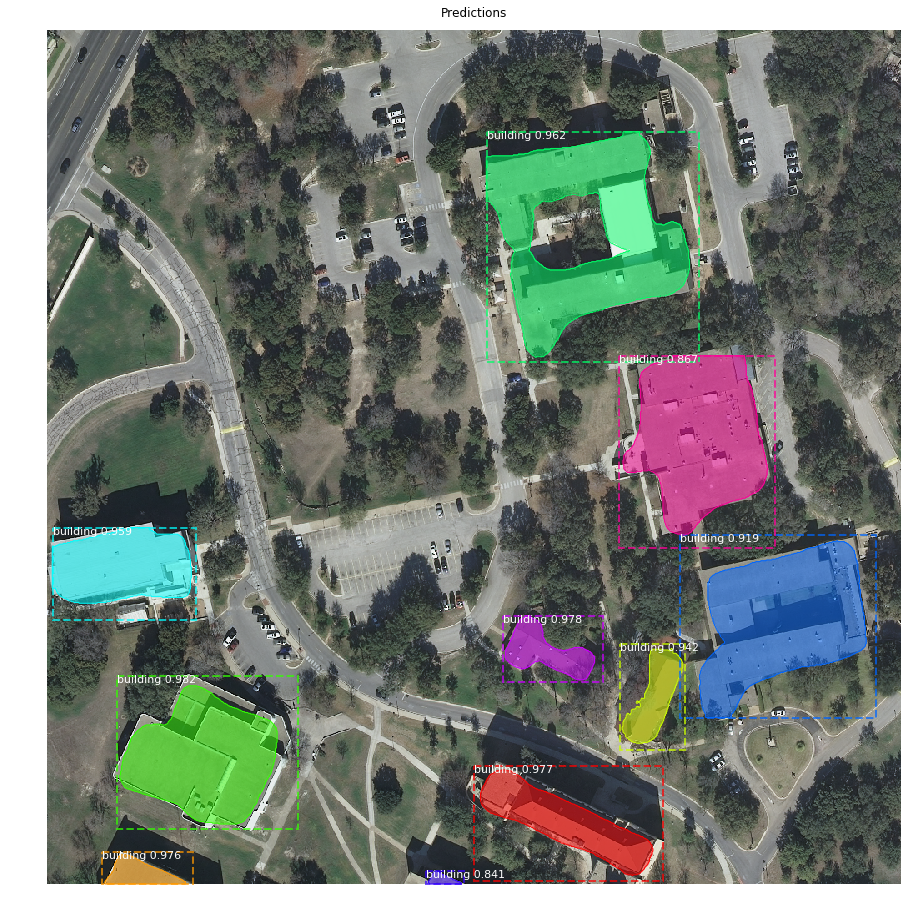

In [20]:
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

## Step by step prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Target

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.
To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [12]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000
target_rpn_bbox          shape: (256, 4)              min:   -9.33200  max:    3.64602
positive_anchors         shape: (21, 4)               min:  280.00000  max: 1026.62742
negative_anchors         shape: (235, 4)              min: -234.03867  max: 1120.00000
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867
refined_anchors          shape: (21, 4)               min:  279.00000  max: 1024.00000


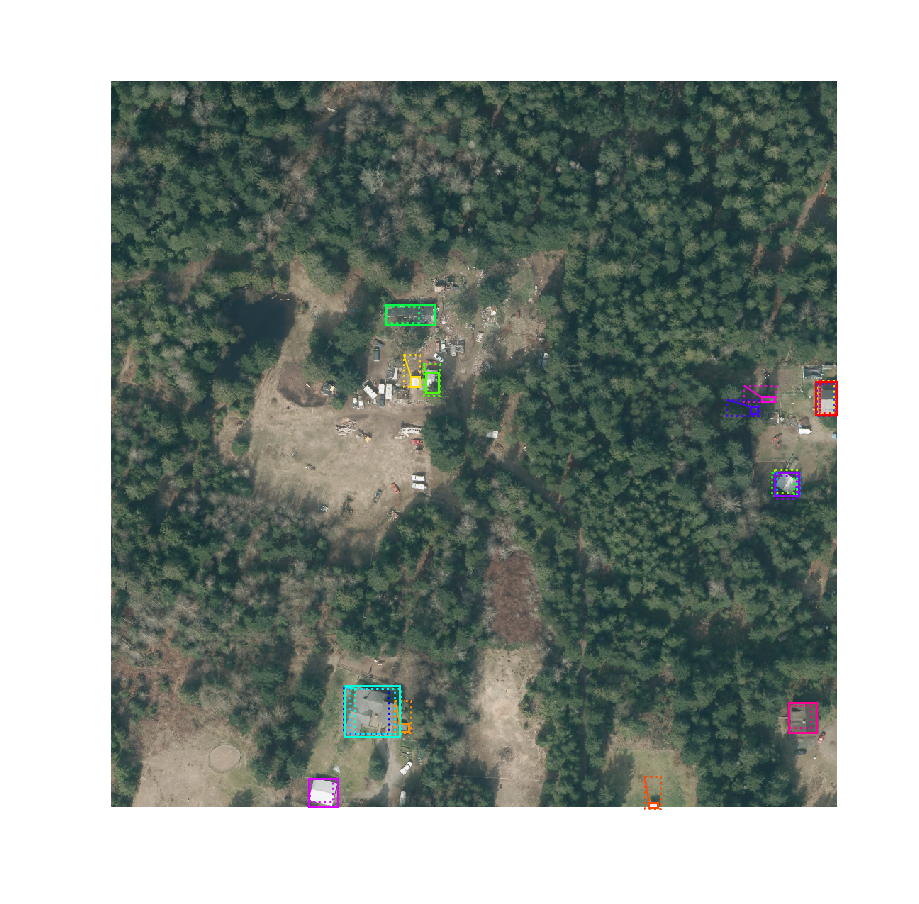

In [13]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [14]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 introduces a new version of NMS. Search for both names to support TF 1.3 and 1.4
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00001  max:    0.99999
pre_nms_anchors          shape: (1, 6000, 4)          min:  -22.62742  max: 1061.25488
refined_anchors          shape: (1, 6000, 4)          min:   -8.00335  max: 1057.98462
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max: 1024.00000
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 2623.00000
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


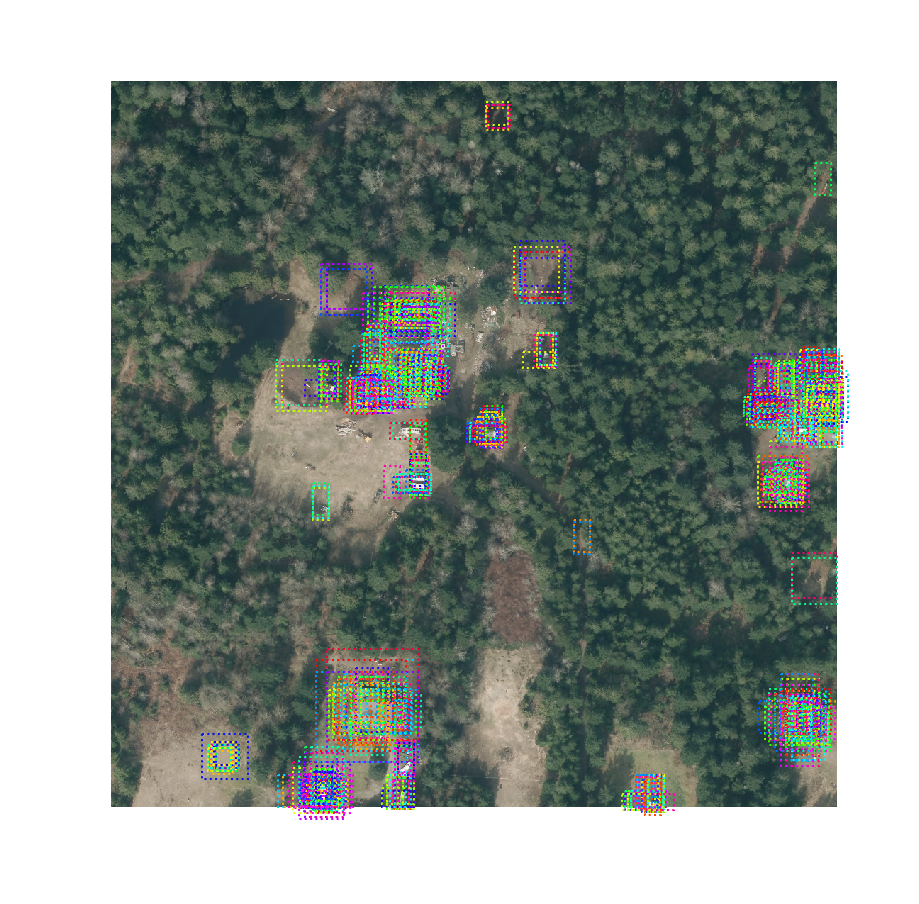

In [15]:
# Show top anchors by score (before refinement)
limit = 1000
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

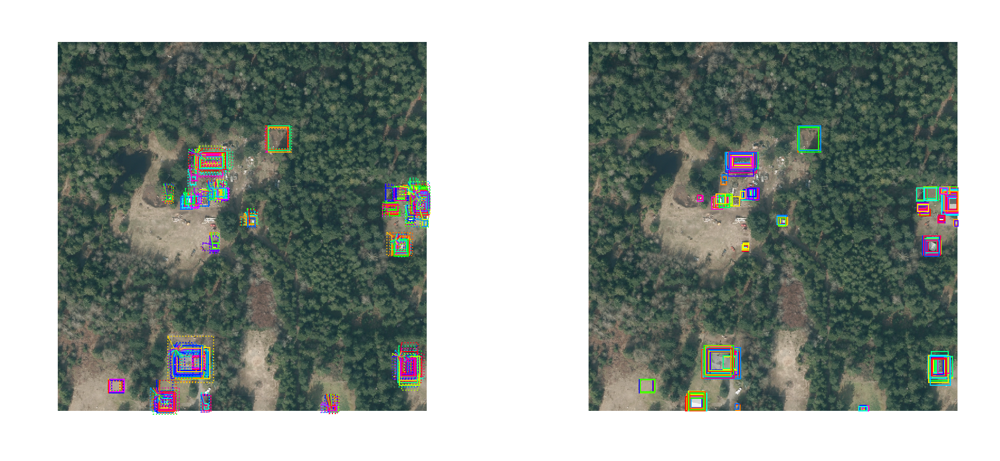

In [16]:
# Show top anchors with refinment. Then with clipping to image boundaries
limit = 500
ax = get_ax(1, 2)
visualize.draw_boxes(image, boxes=rpn["pre_nms_anchors"][0, :limit], 
           refined_boxes=rpn["refined_anchors"][0, :limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, :limit], ax=ax[1])

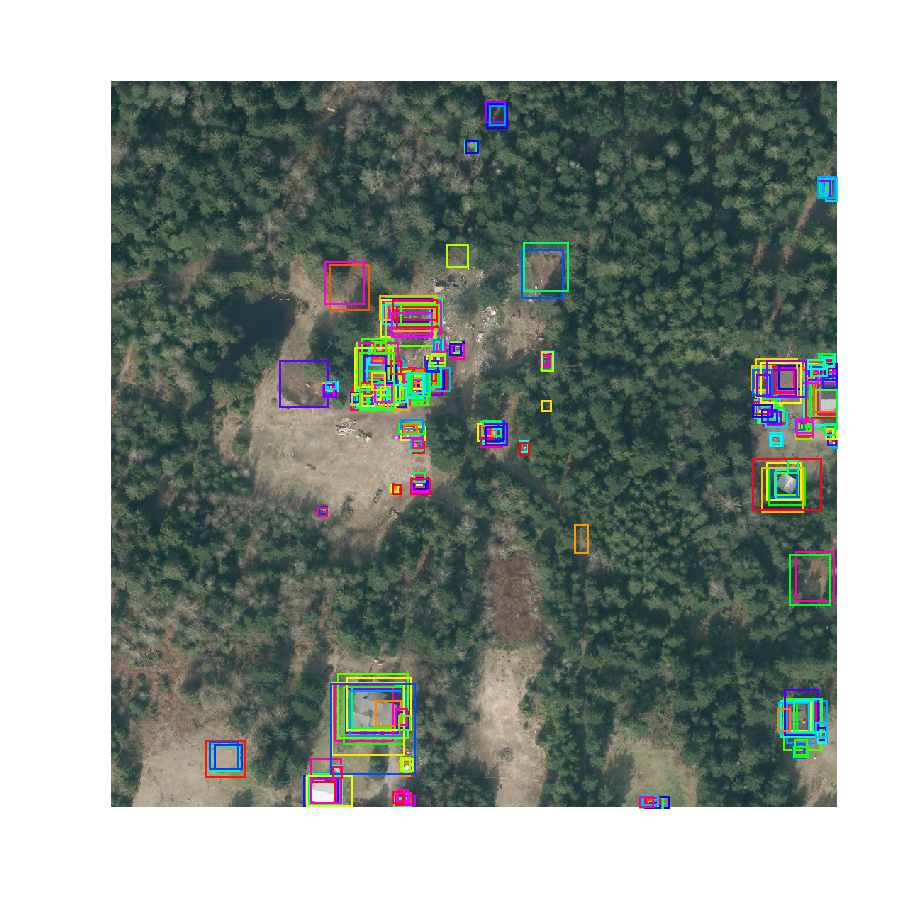

In [17]:
# Show refined anchors after non-max suppression
limit = 500
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, ixs], ax=get_ax())

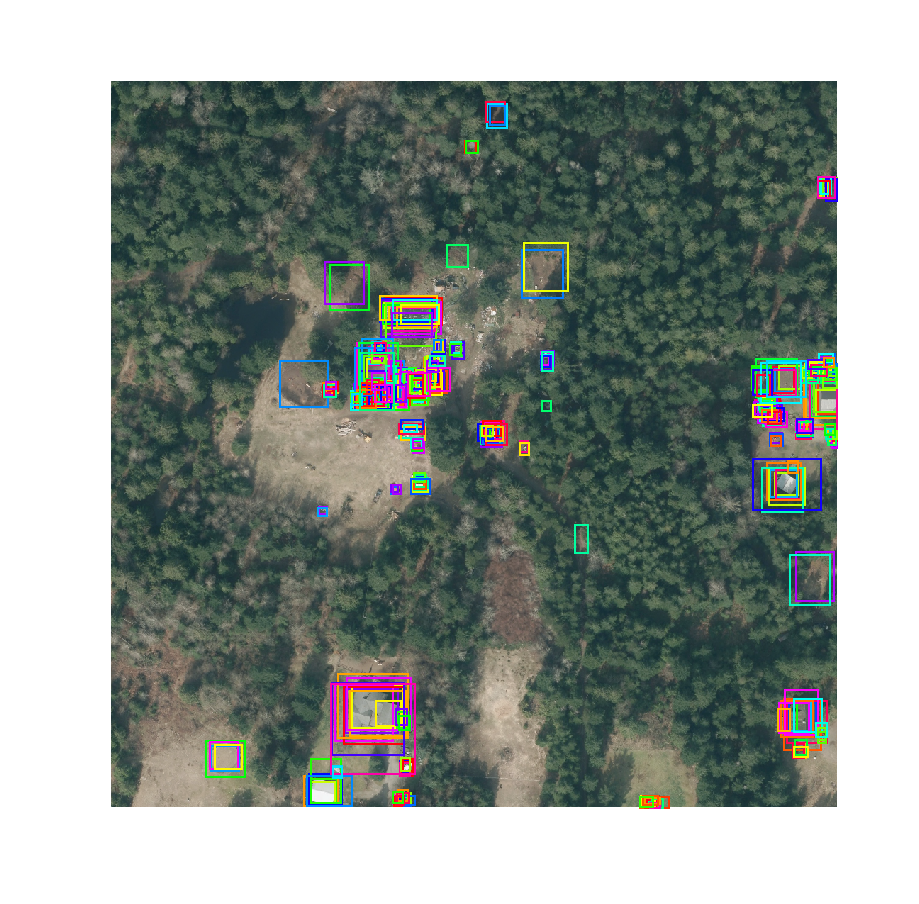

In [18]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
#limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [19]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))



All Anchors (261888)       Recall: 0.250  Positive anchors: 12
Refined Anchors ( 6000)   Recall: 0.750  Positive anchors: 282
Post NMS Anchors (  500)  Recall: 0.750  Positive anchors: 20


## Stage 2: Proposal Classification

### 2.a Proposal Classification

In [31]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

[    0.     0.  1024.  1024.]
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000
probs                    shape: (1, 1000, 2)          min:    0.00011  max:    0.99989
deltas                   shape: (1, 1000, 2, 4)       min:   -2.91730  max:    2.76577
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00006  max:    0.99952
detections               shape: (1, 100, 6)           min:    0.00000  max: 1024.00000


In [32]:
mrcnn['detections']

array([[[  6.00000000e+01,   6.31000000e+02,   1.44000000e+02,
           7.04000000e+02,   1.00000000e+00,   9.71693456e-01],
        [  9.98000000e+02,   5.56000000e+02,   1.02400000e+03,
           6.07000000e+02,   1.00000000e+00,   9.69565630e-01],
        [  8.98000000e+02,   4.26000000e+02,   9.54000000e+02,
           4.81000000e+02,   1.00000000e+00,   9.63374436e-01],
        [  1.99000000e+02,   9.22000000e+02,   4.15000000e+02,
           1.02400000e+03,   1.00000000e+00,   9.28375125e-01],
        [  8.15000000e+02,   9.52000000e+02,   9.20000000e+02,
           1.02400000e+03,   1.00000000e+00,   9.11580682e-01],
        [  1.00000000e+03,   3.30000000e+02,   1.02400000e+03,
           3.90000000e+02,   1.00000000e+00,   8.97987723e-01],
        [  7.79000000e+02,   9.86000000e+02,   8.15000000e+02,
           1.02200000e+03,   1.00000000e+00,   8.87820005e-01],
        [  7.55000000e+02,   1.51000000e+02,   8.35000000e+02,
           2.29000000e+02,   1.00000000e+00,   8

14 detections: ['building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building']


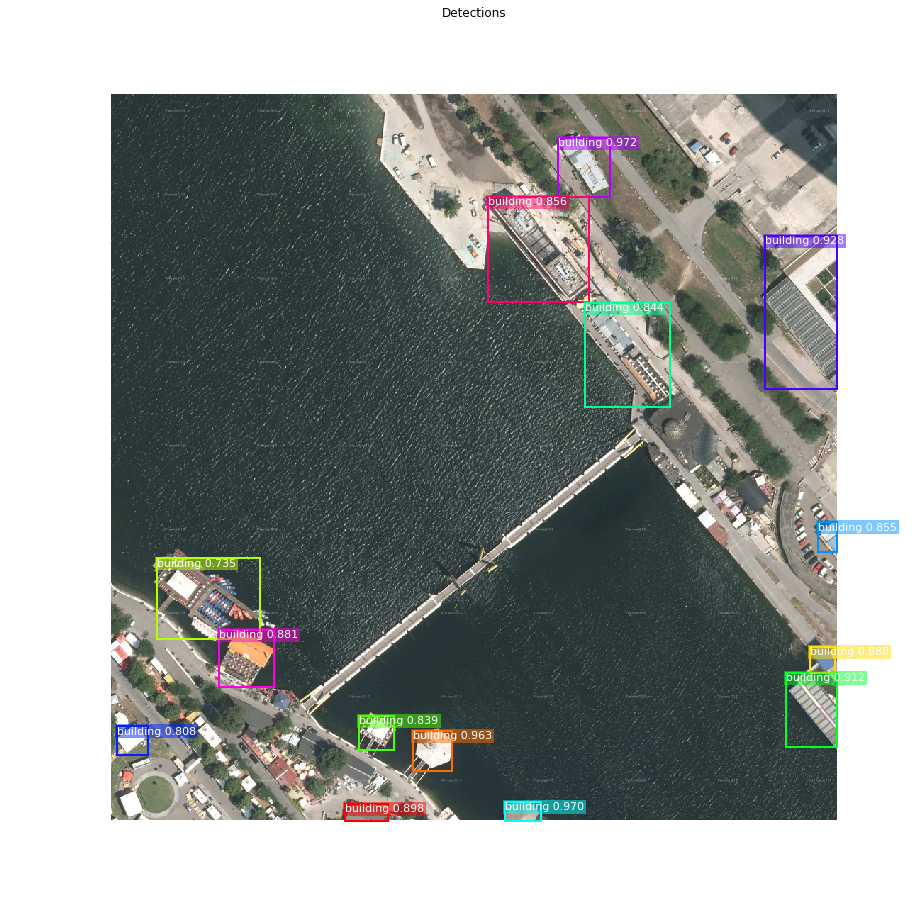

In [33]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=detections[:, :4],
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

In [34]:
detections.shape

(14, 6)

### 2.c Step by Step Detection

In [35]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

666 Valid proposals out of 1000
52 Positive ROIs
[('BG', 948), ('building', 52)]


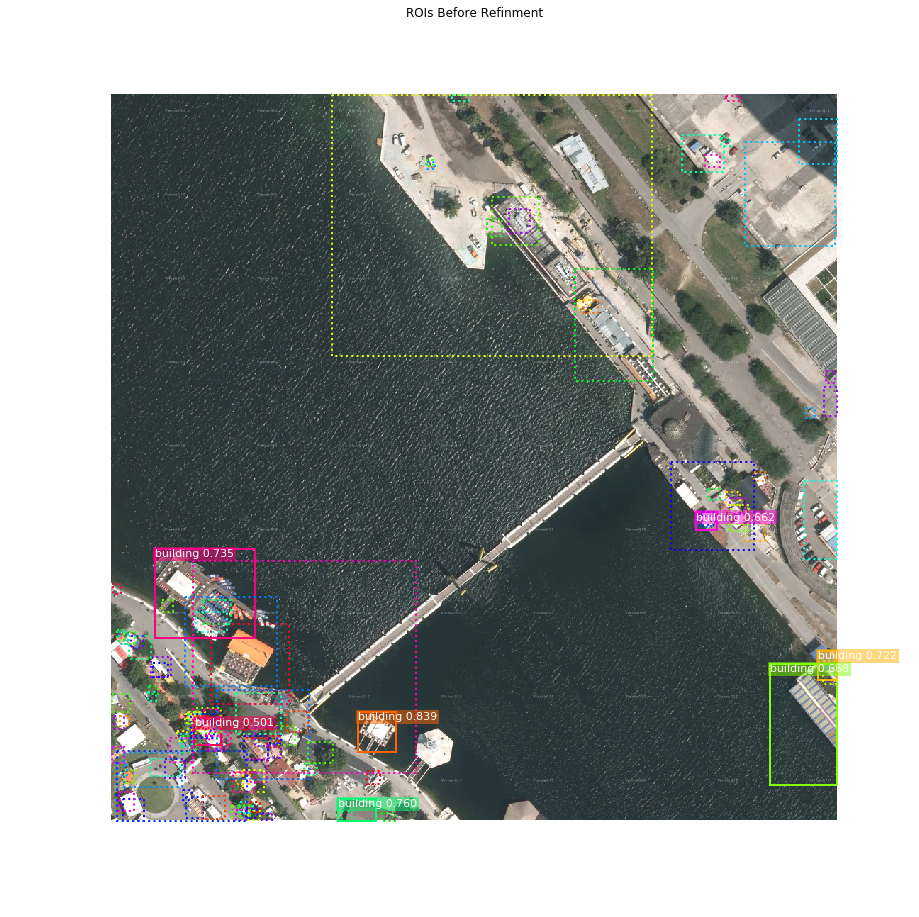

In [36]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinment",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.70463  max:    2.67165
refined_proposals        shape: (1000, 4)             min: -158.00000  max: 1042.00000


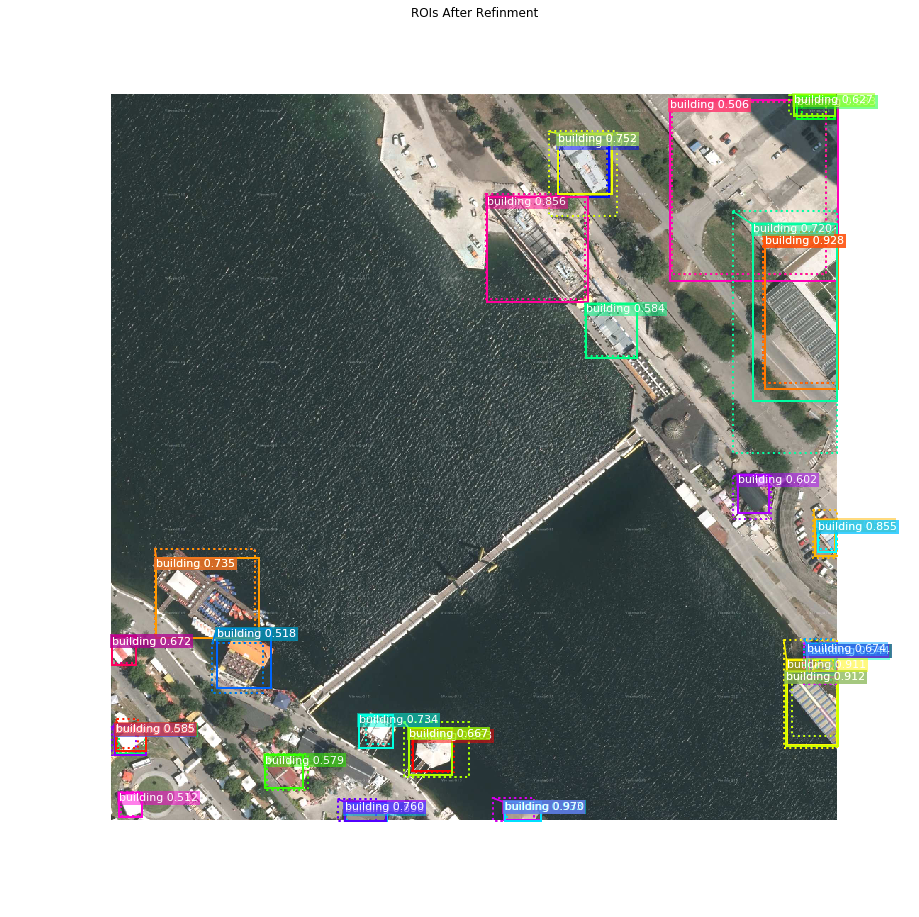

In [37]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 50 # change here to display all
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinment",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [38]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 52 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  17  18  20
  21  22  23  25  29  30  31  33  34  39  43  45  47  51  61  66  77  91
  92 100 103 113 114 137 141 209 221 296 366 398 427 478 549 582]


In [39]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.7 confidence. Keep 24:
[  0   1   2   3   4   5   6   7   8   9  10  11  13  23  30  31  39  51
  77  91 103 221 296 427]


#### Per-Class Non-Max Suppression

In [40]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

building              : [  0   1   2   3   4   5   6   7   8   9  10  11  13  23  30  31  39  51
  77  91 103 221 296 427] -> [ 4  3  2  0 51  1  5  6 10  7 11  8 30 13]

Kept after per-class NMS: 14
[ 0  1  2  3  4  5  6  7  8 10 11 13 30 51]


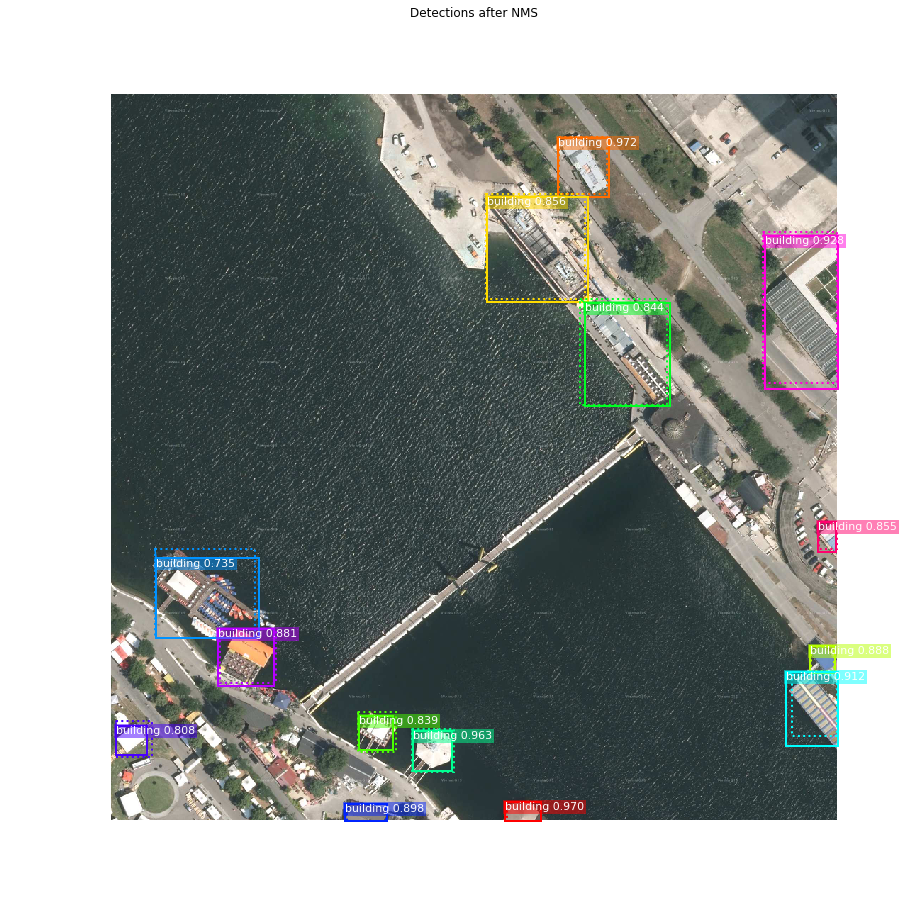

In [41]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

### 3.a Mask Targets

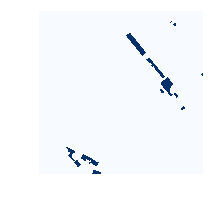

In [42]:
#display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")
# instead of displaying one image per instance, we display the full mask
display_images(np.transpose(np.sum(gt_mask,2,keepdims=True), [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [43]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

[    0.     0.  1024.  1024.]
detections               shape: (1, 100, 6)           min:    0.00000  max: 1024.00000
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00006  max:    0.99952


In [44]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
#det_count = len(det_class_ids)
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

14 detections: ['building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building']


In [45]:
mrcnn["detections"]

array([[[  6.00000000e+01,   6.31000000e+02,   1.44000000e+02,
           7.04000000e+02,   1.00000000e+00,   9.71693456e-01],
        [  9.98000000e+02,   5.56000000e+02,   1.02400000e+03,
           6.07000000e+02,   1.00000000e+00,   9.69565630e-01],
        [  8.98000000e+02,   4.26000000e+02,   9.54000000e+02,
           4.81000000e+02,   1.00000000e+00,   9.63374436e-01],
        [  1.99000000e+02,   9.22000000e+02,   4.15000000e+02,
           1.02400000e+03,   1.00000000e+00,   9.28375125e-01],
        [  8.15000000e+02,   9.52000000e+02,   9.20000000e+02,
           1.02400000e+03,   1.00000000e+00,   9.11580682e-01],
        [  1.00000000e+03,   3.30000000e+02,   1.02400000e+03,
           3.90000000e+02,   1.00000000e+00,   8.97987723e-01],
        [  7.79000000e+02,   9.86000000e+02,   8.15000000e+02,
           1.02200000e+03,   1.00000000e+00,   8.87820005e-01],
        [  7.55000000e+02,   1.51000000e+02,   8.35000000e+02,
           2.29000000e+02,   1.00000000e+00,   8

In [46]:
# Masks
det_boxes = mrcnn["detections"][0, :, :4].astype(np.int32)
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (14, 28, 28)          min:    0.00006  max:    0.99952
det_masks                shape: (14, 1024, 1024)      min:    0.00000  max:    1.00000


In [47]:
det_mask_specific

array([[[  5.83577231e-02,   6.34576753e-02,   8.11536908e-02, ...,
           2.18645699e-04,   9.25864209e-04,   8.44886235e-04],
        [  8.69818479e-02,   1.12313330e-01,   2.00665891e-01, ...,
           2.35055573e-04,   8.90415045e-04,   8.50499200e-04],
        [  1.75580308e-01,   3.04159373e-01,   4.89600420e-01, ...,
           1.30076471e-04,   2.27546348e-04,   2.47449352e-04],
        ..., 
        [  8.29442928e-04,   7.74934480e-04,   7.32292247e-04, ...,
           4.31258492e-02,   1.74664464e-02,   1.22558130e-02],
        [  3.14648030e-03,   2.73605087e-03,   1.25125539e-03, ...,
           8.26948974e-03,   7.60090072e-03,   5.69082657e-03],
        [  2.95117451e-03,   2.65090028e-03,   1.08945125e-03, ...,
           4.01186477e-03,   5.63300168e-03,   4.76213312e-03]],

       [[  6.25219941e-03,   6.22476637e-03,   6.36854162e-03, ...,
           2.00172863e-03,   3.75024555e-03,   3.04197986e-03],
        [  6.67426828e-03,   7.02177268e-03,   8.44071712e-0

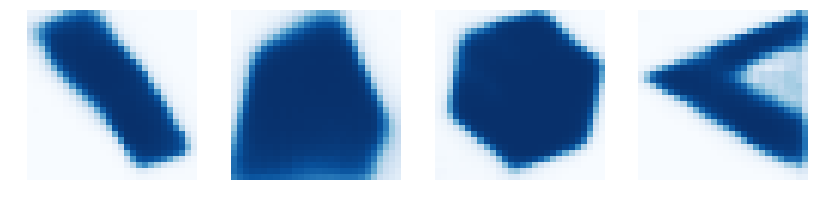

In [48]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

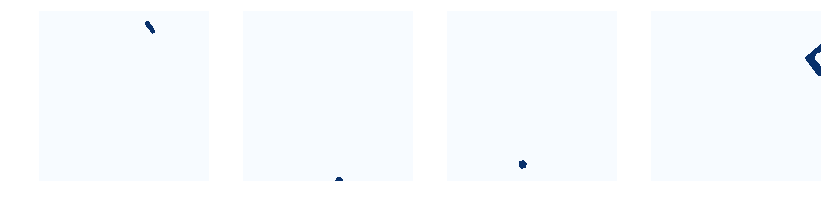

In [58]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")